In [135]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM,SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from tensorflow.keras import losses
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects
from tensorflow.keras.models import load_model


In [136]:

period_size = 150
step_size = 50
median_q_threshold=0.5
lower_q_threshold=0.1
upper_q_threshold=0.9
anomaly_res =[15,11]


                timestamp   value
1271  2014-02-19 00:22:00  62.056
2970  2014-02-24 21:57:00  68.092

timestamp    2014-02-19 00:22:00
value                     62.056
label                          0
Name: 1271, dtype: object

timestamp    2014-02-19 00:22:00
value                     62.056
label                          1
Name: 1271, dtype: object
timestamp    2014-02-24 21:57:00
value                     68.092
label                          1
Name: 2970, dtype: object


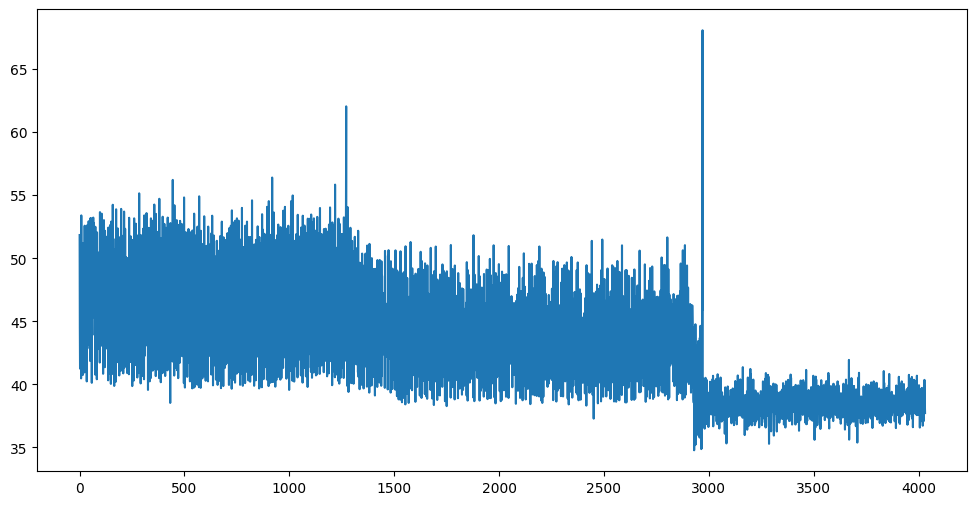

In [137]:
dataframe = read_csv('D:/Q-TV-RNN-Architecture/Q-TV-RNN/archive/realAWSCloudwatch/realAWSCloudwatch/ec2_cpu_utilization_5f5533.csv',  engine='python')
dataframe = dataframe.sort_values(by='timestamp')
dataframe["value"]
plt.figure(figsize=(12, 6))
plt.plot(dataframe['value'])
print(dataframe[dataframe['value'] > 60])

dataframe2 = dataframe
dataframe2['label'] = 0
print()
print(dataframe2.iloc[1271])

dataframe2.loc[1271,'label'] = 1
dataframe2.loc[2970,'label'] = 1

print()
print(dataframe2.iloc[1271])

print(dataframe2.iloc[2970])


In [138]:


class Swish(Layer):
    def __init__(self, beta, **kwargs):
        super(Swish, self).__init__(**kwargs)
        self.beta = K.cast_to_floatx(beta)
        print('beta',self.beta)

    def call(self, inputs):
        print('beta', self.beta,'input',inputs)
        return K.softsign(inputs) * self.beta

    def get_config(self):
        config = {'beta': float(self.beta)}
        base_config = super(Swish, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_output_shape(self, input_shape):
        return input_shape


def intersection(lst1, lst2):
    lst3=[]
    for itr in range(len(lst1)):
        if lst1[itr][0] in lst2:
            lst3.append(lst1[itr])
    return lst3



def verify_stationarity(dataset):
    is_stationary=True
    test_results = adfuller(dataset)

    print(f"ADF test statistic: {test_results[0]}")
    print(f"p-value: {test_results[1]}")
    print("Critical thresholds:")

    for key, value in test_results[4].items():
        print(f"\t{key}: {value}")
    itr = 0
    for key, value in test_results[4].items():
       print('\t%s: %.3f' % (key, value))
       if itr==0:
         critical=value
       itr=itr+1

    print('critical',critical)
    if test_results[0] > critical:
         print('non stationary')
         is_stationary=False
    return  is_stationary

def create_dataset(dataset, look_back=1, tw=3):
    dataX, dataY = [], []  # dtaset for mean
    dataUpperX, dataUpperY = [], []  # dataset for std
    dataLowerX, dataLowerY = [], []  # dataset for mean and std for third deep learning
    multi = look_back // tw
    for i in range(len(dataset) - look_back - 1):
        q50X = []
        q90X =  []
        q10X = []
        a = dataset[i + 1:(i + look_back + 1)]
        indices = i + (multi - 1) * tw
        # print('last window', dataset[indices:(i + look_back), 0])
        c = numpy.quantile(a, median_q_threshold)
        u = numpy.quantile(a, upper_q_threshold)
        l = numpy.quantile(a, lower_q_threshold)
        for j in range(0, len(a), tw):
            q50 = numpy.quantile(a[j:j + tw], median_q_threshold)
            q90 = numpy.quantile(a[j:j + tw], upper_q_threshold)
            q10 = numpy.quantile(a[j:j + tw], lower_q_threshold)
            q50X.append(q50)
            q90X.append(q90)
            q10X.append(q10)
        dataX.append(q50X)
        dataY.append(c)
        dataUpperX.append(q90X)
        dataUpperY.append(u)
        dataLowerX.append(q10X)
        dataLowerY.append(l)

    
    return numpy.array(dataX), numpy.array(dataY), numpy.array(dataUpperX), numpy.array(dataUpperY), numpy.array(dataLowerX), numpy.array(dataLowerY)

def identify_anomaly_quantiles(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        upper_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.9)
        lower_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.1)
        #upper_threshold=avg+2*std1
        #lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]>0 and period_prediction_errors[i]> upper_threshold) or (period_prediction_errors[i]<0 and period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])

    return anomaly_detection

def identify_anomaly(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        avg = numpy.average(prediction_errors[m:m + period_size])
        std1 = numpy.std(prediction_errors[m:m + period_size])
        upper_threshold=avg+2*std1
        lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]> upper_threshold) or ( period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])


    return  anomaly_detection

def identify_alpha(dataset):
    alpha_detection=[]
    alpha=1
    prev_slope=1
    for m in range(0, len(dataset), period_size):
        period_dataset=dataset[m:m + period_size]
        slope=period_dataset[len(period_dataset)-1]-period_dataset[0]
        slope=slope/period_size
        alpha=slope/prev_slope
        alpha_detection.append(alpha)
        prev_slope=slope

    return  numpy.absolute(numpy.mean(alpha_detection))

ADF test statistic: -0.7335076896084329
p-value: 0.8378783641046514
Critical thresholds:
	1%: -3.431984648591583
	5%: -2.862262298327622
	10%: -2.5671544870656278
	1%: -3.432
	5%: -2.862
	10%: -2.567
critical -3.431984648591583
non stationary
dataset [[51.846]
 [44.508]
 [41.244]
 ...
 [37.912]
 [38.458]
 [37.718]]
ADF test statistic: -0.7335075155036972
p-value: 0.8378784112012503
Critical thresholds:
	1%: -3.431984648591583
	5%: -2.862262298327622
	10%: -2.5671544870656278
	1%: -3.432
	5%: -2.862
	10%: -2.567
critical -3.431984648591583
non stationary
[[0.3461861  0.3652103  0.34555596]
 [0.34735632 0.36274976 0.3486467 ]
 [0.34735632 0.36274976 0.34555596]
 ...
 [0.25376576 0.26246768 0.2620176 ]
 [0.25376576 0.26246768 0.26483822]
 [0.25376576 0.26246768 0.2620176 ]]
alpha 1.8472232
[[[0.3461861 ]
  [0.3652103 ]
  [0.34555596]]

 [[0.34735632]
  [0.36274976]
  [0.3486467 ]]

 [[0.34735632]
  [0.36274976]
  [0.34555596]]

 ...

 [[0.25376576]
  [0.26246768]
  [0.2620176 ]]

 [[0.253

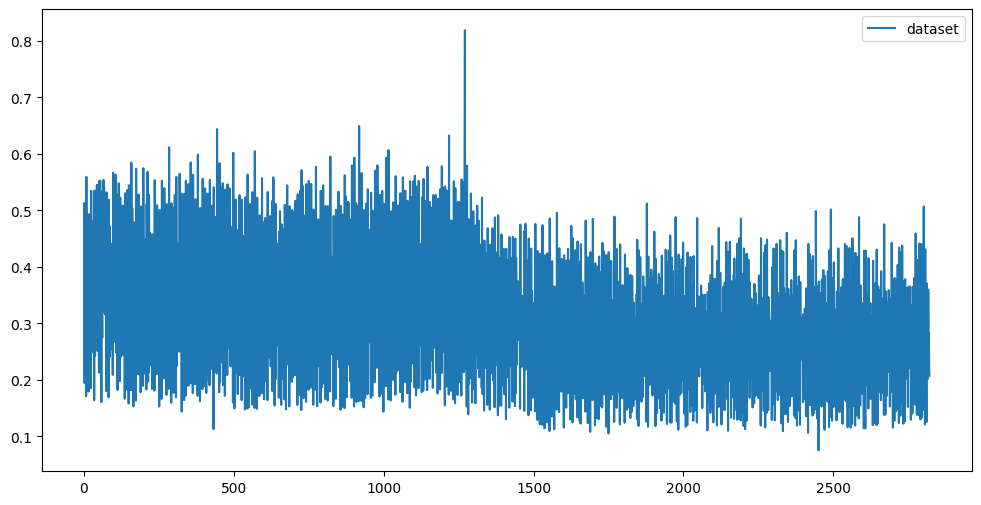

In [139]:
# fix random seed for reproducibility
numpy.random.seed(7)
# load the dataset
dataframe = dataframe['value']
dataset = dataframe.values
dataset = dataset.reshape(-1, 1)

stationary=verify_stationarity(dataset)
#dataframe=dataframe.diff(axis = 0, periods = 1)
#dataset = dataframe.dropna().values
dataset = dataset.astype('float32')
# normalize the dataset
print('dataset', dataset)
#dataset=dataset.dropna()
stationary = verify_stationarity(dataset)
scaler = MinMaxScaler(feature_range=(0, 1))

dataset = scaler.fit_transform(dataset)

# split into train and test sets
train_size = int(len(dataset) * 0.7)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]
std=numpy.std(train)
# reshape into X=t and Y=t+1
look_back = period_size
tw = step_size
multi = look_back // tw
trainX, trainY, trainXU, trainYU, trainXL, trainYL = create_dataset(train, look_back, tw)
testX, testY , testXU, testYU, testXL, testYL= create_dataset(test, look_back, tw)
print(trainX)
plt.figure(figsize=(12, 6))
# plt.plot(ts, label="passengers")
plt.plot(train, label="dataset")
# plt.plot(anomalies_array, label="difference")
# plt.plot(newdata['ewa'], label="ewa")
plt.legend(loc='best')

#plt.show()
alpha=identify_alpha(dataset)
print('alpha',alpha)
# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

trainXU = numpy.reshape(trainXU, (trainXU.shape[0], trainXU.shape[1], 1))
testXU = numpy.reshape(testXU, (testXU.shape[0], testXU.shape[1], 1))

trainXL = numpy.reshape(trainXL, (trainXL.shape[0], trainXL.shape[1], 1))
testXL = numpy.reshape(testXL, (testXL.shape[0], testXL.shape[1], 1))
print(trainX)


In [140]:
len(dataset)

4032

In [141]:
print("Splitting datasets into 3 parts for ensemble training...")

# Split q50 (median) data
trainX_parts = numpy.array_split(trainX, 3)
trainY_parts = numpy.array_split(trainY, 3)

# Split q10 (lower) data
trainXL_parts = numpy.array_split(trainXL, 3)
trainYL_parts = numpy.array_split(trainYL, 3)

# Split q90 (upper) data
trainXU_parts = numpy.array_split(trainXU, 3)
trainYU_parts = numpy.array_split(trainYU, 3)



Splitting datasets into 3 parts for ensemble training...


In [142]:
print("Splitting test datasets into 3 parts for ensemble testing...")

# Split q50 (median) data
testX_parts = numpy.array_split(testX, 3)
testY_parts = numpy.array_split(testY, 3)

# Split q10 (lower) data
testXL_parts = numpy.array_split(testXL, 3)
testYL_parts = numpy.array_split(testYL, 3)

# Split q90 (upper) data
testXU_parts = numpy.array_split(testXU, 3)
testYU_parts = numpy.array_split(testYU, 3)

Splitting test datasets into 3 parts for ensemble testing...


In [143]:
trainX_parts[0].shape

(891, 3, 1)

In [144]:
print(trainX.shape)
print(trainY.shape)
print(testX.shape)
print(multi)

(2671, 3, 1)
(2671,)
(1059, 3, 1)
3


In [145]:

modelq50_1 = Sequential()
modelq50_1.add(SimpleRNN(4, input_shape=(multi, 1)) )
modelq50_1.add(Dense(1))
modelq50_1.add(Swish(beta=1.5))
modelq50_1.add(Activation(Swish(beta=1.5)))
modelq50_1.compile(loss=losses.logcosh, optimizer='adam')
modelq50_1.fit(trainX_parts[0], trainY_parts[0], epochs=50, batch_size=1, verbose=2)

modelq10_1 = Sequential()
modelq10_1.add(SimpleRNN(4, input_shape=(multi, 1)))
modelq10_1.add(Dense(1))
modelq10_1.add(Swish(beta=1.5))
modelq10_1.add(Activation(Swish(beta=1.5)))
modelq10_1.compile(loss=losses.logcosh, optimizer='adam')
modelq10_1.fit(trainXL_parts[0], trainYL_parts[0], epochs=50, batch_size=1, verbose=2)

modelq90_1 = Sequential()
modelq90_1.add(SimpleRNN(4, input_shape=(multi, 1)))
modelq90_1.add(Dense(1))
modelq90_1.add(Swish(beta=1.5))
modelq90_1.add(Activation(Swish(beta=1.5)))
modelq90_1.compile(loss=losses.logcosh, optimizer='adam')
modelq90_1.fit(trainXU_parts[0], trainYU_parts[0], epochs=50, batch_size=1, verbose=2)
modelq10_1.save_weights("modelq10_1.weights.h5")
modelq50_1.save_weights("modelq50_1.weights.h5")
modelq90_1.save_weights("modelq90_1.weights.h5")

modelq50_2 = Sequential()
modelq50_2.add(SimpleRNN(4, input_shape=(multi, 1)) )
modelq50_2.add(Dense(1))
modelq50_2.add(Swish(beta=1.5))
modelq50_2.add(Activation(Swish(beta=1.5)))
modelq50_2.compile(loss=losses.logcosh, optimizer='adam')
modelq50_2.fit(trainX_parts[1], trainY_parts[1], epochs=50, batch_size=1, verbose=2)

modelq10_2 = Sequential()
modelq10_2.add(SimpleRNN(4, input_shape=(multi, 1)))
modelq10_2.add(Dense(1))
modelq10_2.add(Swish(beta=1.5))
modelq10_2.add(Activation(Swish(beta=1.5)))
modelq10_2.compile(loss=losses.logcosh, optimizer='adam')
modelq10_2.fit(trainXL_parts[1], trainYL_parts[1], epochs=50, batch_size=1, verbose=2)

modelq90_2 = Sequential()
modelq90_2.add(SimpleRNN(4, input_shape=(multi, 1)))
modelq90_2.add(Dense(1))
modelq90_2.add(Swish(beta=1.5))
modelq90_2.add(Activation(Swish(beta=1.5)))
modelq90_2.compile(loss=losses.logcosh, optimizer='adam')
modelq90_2.fit(trainXU_parts[1], trainYU_parts[1], epochs=50, batch_size=1, verbose=2)
modelq10_2.save_weights("modelq10_2.weights.h5")
modelq50_2.save_weights("modelq50_2.weights.h5")
modelq90_2.save_weights("modelq90_2.weights.h5")

modelq50_3 = Sequential()
modelq50_3.add(SimpleRNN(4, input_shape=(multi, 1)) )
modelq50_3.add(Dense(1))
modelq50_3.add(Swish(beta=1.5))
modelq50_3.add(Activation(Swish(beta=1.5)))
modelq50_3.compile(loss=losses.logcosh, optimizer='adam')
modelq50_3.fit(trainX_parts[2], trainY_parts[2], epochs=50, batch_size=1, verbose=2)

modelq10_3 = Sequential()
modelq10_3.add(SimpleRNN(4, input_shape=(multi, 1)))
modelq10_3.add(Dense(1))
modelq10_3.add(Swish(beta=1.5))
modelq10_3.add(Activation(Swish(beta=1.5)))
modelq10_3.compile(loss=losses.logcosh, optimizer='adam')
modelq10_3.fit(trainXL_parts[2], trainYL_parts[2], epochs=50, batch_size=1, verbose=2)

modelq90_3 = Sequential()
modelq90_3.add(SimpleRNN(4, input_shape=(multi, 1)))
modelq90_3.add(Dense(1))
modelq90_3.add(Swish(beta=1.5))
modelq90_3.add(Activation(Swish(beta=1.5)))
modelq90_3.compile(loss=losses.logcosh, optimizer='adam')
modelq90_3.fit(trainXU_parts[2], trainYU_parts[2], epochs=50, batch_size=1, verbose=2)
modelq10_3.save_weights("modelq10_3.weights.h5")
modelq50_3.save_weights("modelq50_3.weights.h5")
modelq90_3.save_weights("modelq90_3.weights.h5")

beta 1.5
beta 1.5
Epoch 1/50


c:\Users\ASUS\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


beta 1.5 input Tensor("sequential_13_1/dense_13_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_13_1/swish_26_1/mul:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_13_1/dense_13_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_13_1/swish_26_1/mul:0", shape=(1, 1), dtype=float32)
891/891 - 3s - 3ms/step - loss: 0.0034
Epoch 2/50
891/891 - 1s - 1ms/step - loss: 4.5749e-05
Epoch 3/50
891/891 - 1s - 1ms/step - loss: 4.4633e-05
Epoch 4/50
891/891 - 1s - 1ms/step - loss: 4.4177e-05
Epoch 5/50
891/891 - 1s - 1ms/step - loss: 4.0633e-05
Epoch 6/50
891/891 - 1s - 2ms/step - loss: 3.9897e-05
Epoch 7/50
891/891 - 1s - 1ms/step - loss: 3.3504e-05
Epoch 8/50
891/891 - 1s - 1ms/step - loss: 2.8632e-05
Epoch 9/50
891/891 - 1s - 992us/step - loss: 2.4406e-05
Epoch 10/50
891/891 - 1s - 1ms/step - loss: 2.0616e-05
Epoch 11/50
891/891 - 1s - 997us/step - loss: 1.6055e-05
Epoch 12/50
891/891 - 1s - 997us/step - loss: 1.3178e-05
Epoch 13/5

In [146]:
# modelq50_1 = Sequential()
# modelq50_1.add(SimpleRNN(4, input_shape=(multi, 1)) )
# modelq50_1.add(Dense(1))
# modelq50_1.add(Swish(beta=1.5))
# modelq50_1.add(Activation(Swish(beta=1.5)))
# modelq50_1.compile(loss=losses.logcosh, optimizer='adam')


# modelq10_1 = Sequential()
# modelq10_1.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq10_1.add(Dense(1))
# modelq10_1.add(Swish(beta=1.5))
# modelq10_1.add(Activation(Swish(beta=1.5)))
# modelq10_1.compile(loss=losses.logcosh, optimizer='adam')


# modelq90_1 = Sequential()
# modelq90_1.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq90_1.add(Dense(1))
# modelq90_1.add(Swish(beta=1.5))
# modelq90_1.add(Activation(Swish(beta=1.5)))
# modelq90_1.compile(loss=losses.logcosh, optimizer='adam')



# modelq50_2 = Sequential()
# modelq50_2.add(SimpleRNN(4, input_shape=(multi, 1)) )
# modelq50_2.add(Dense(1))
# modelq50_2.add(Swish(beta=1.5))
# modelq50_2.add(Activation(Swish(beta=1.5)))
# modelq50_2.compile(loss=losses.logcosh, optimizer='adam')


# modelq10_2 = Sequential()
# modelq10_2.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq10_2.add(Dense(1))
# modelq10_2.add(Swish(beta=1.5))
# modelq10_2.add(Activation(Swish(beta=1.5)))
# modelq10_2.compile(loss=losses.logcosh, optimizer='adam')


# modelq90_2 = Sequential()
# modelq90_2.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq90_2.add(Dense(1))
# modelq90_2.add(Swish(beta=1.5))
# modelq90_2.add(Activation(Swish(beta=1.5)))
# modelq90_2.compile(loss=losses.logcosh, optimizer='adam')



# modelq50_3 = Sequential()
# modelq50_3.add(SimpleRNN(4, input_shape=(multi, 1)) )
# modelq50_3.add(Dense(1))
# modelq50_3.add(Swish(beta=1.5))
# modelq50_3.add(Activation(Swish(beta=1.5)))
# modelq50_3.compile(loss=losses.logcosh, optimizer='adam')


# modelq10_3 = Sequential()
# modelq10_3.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq10_3.add(Dense(1))
# modelq10_3.add(Swish(beta=1.5))
# modelq10_3.add(Activation(Swish(beta=1.5)))
# modelq10_3.compile(loss=losses.logcosh, optimizer='adam')


# modelq90_3 = Sequential()
# modelq90_3.add(SimpleRNN(4, input_shape=(multi, 1)))
# modelq90_3.add(Dense(1))
# modelq90_3.add(Swish(beta=1.5))
# modelq90_3.add(Activation(Swish(beta=1.5)))
# modelq90_3.compile(loss=losses.logcosh, optimizer='adam')


# modelq10_1.load_weights("modelq10_1.weights.h5")
# modelq50_1.load_weights("modelq50_1.weights.h5")
# modelq90_1.load_weights("modelq90_1.weights.h5")
# modelq10_2.load_weights("modelq10_2.weights.h5")
# modelq50_2.load_weights("modelq50_2.weights.h5")
# modelq90_2.load_weights("modelq90_2.weights.h5")
# modelq10_3.load_weights("modelq10_3.weights.h5")
# modelq50_3.load_weights("modelq50_3.weights.h5")
# modelq90_3.load_weights("modelq90_3.weights.h5")

In [147]:
i = 0
j = look_back
actual_quantile_interval = []
steps = tw
positive = True
anomalies=[]
finalres_q10 = []
finalres_q90 = []
dataframe = dataframe2['value']
dataset = dataframe.values
dataset = dataset.reshape(-1,1)
dataset = scaler.fit_transform(dataset)
ar = [62,68]
# ar.append(dataset[1271][0])
# ar.append(dataset[2970][0])



ts = dataset
ts_accumulate=[]
comparison_dataset=[]
p_q10 = []
p_q50 = []
p_q90 = []

ar

[62, 68]

In [148]:
dataframe2 = dataframe2
dataframe2[dataframe2 == 1].dropna()


,timestamp,value,label


In [149]:
len(dataset)

4032

In [150]:

while j <= len(dataset)-2:
    q50_array = []
    q10_array = []
    q90_array = []

    temp = dataset[i:j]
    actual_quantile_interval.append(
        numpy.absolute(numpy.quantile(dataset[i + 1:j + 1], lower_q_threshold) - numpy.quantile(dataset[i + 1:j + 1], median_q_threshold)))
    #print('print here', temp)

    for m in range(0, len(temp), steps):
        q50array = []
        q10array = []
        q90array = []
        q50 = numpy.quantile(temp[m:m + steps], median_q_threshold)
        q50array.append(q50)
        q50_array.append(q50array)

        q90 = numpy.quantile(temp[m:m + steps], upper_q_threshold)
        q90array.append(q90)
        q90_array.append(q90array)

        q10 = numpy.quantile(temp[m:m + steps], lower_q_threshold)
        q10array.append(q10)
        q10_array.append(q10array)

    final_q50_array = []
    final_q50_array.append(q50_array)
    #print('final_q10_array', final_q50_array)
    final_q10_array = []
    final_q10_array.append(q10_array)

    final_q90_array = []
    final_q90_array.append(q90_array)

    
    p_q10.append(final_q10_array)
    p_q50.append(final_q50_array)
    p_q90.append(final_q90_array)

    j = j + 1
    i = i + 1


In [151]:
print(len(p_q10))
print(len(p_q10[0]))
print(len(p_q10[0][0]))
print(len(p_q10[0][0][0]))

3881
1
3
1


In [152]:
leftover_len = len(dataset)-152
one_third_part = leftover_len//3    

In [153]:
print(one_third_part)

1293


In [154]:
j = 150
one_third_part_idx = j+one_third_part
i = 0
while j <= len(dataset)-2:
    if(one_third_part_idx < j):
        #first    
        q50_predict = modelq50_1.predict(numpy.array(p_q50[i]).reshape(1,3,1))
        print('q50_predict', q50_predict)
        q10_predict = modelq10_1.predict(numpy.array(p_q10[i]).reshape(1,3,1))
        q90_predict = modelq90_1.predict(numpy.array(p_q90[i]).reshape(1,3,1))

    elif((one_third_part_idx>j)&((one_third_part_idx+one_third_part)<j)):
        #second
        q50_predict = modelq50_2.predict(numpy.array(p_q50[i]).reshape(1,3,1))
        print('q50_predict', q50_predict)
        q10_predict = modelq10_2.predict(numpy.array(p_q10[i]).reshape(1,3,1))
        q90_predict = modelq90_2.predict(numpy.array(p_q90[i]).reshape(1,3,1))

    else:
        #third
        q50_predict = modelq50_3.predict(numpy.array(p_q50[i]).reshape(1,3,1))
        print('q50_predict', q50_predict)
        q10_predict = modelq10_3.predict(numpy.array(p_q10[i]).reshape(1,3,1))
        q90_predict = modelq90_3.predict(numpy.array(p_q90[i]).reshape(1,3,1))



    if j+1 < len(dataset) :
        iqr=q90_predict-q10_predict
        ucl=q50_predict+.95*iqr
        lcl=q50_predict-.95*iqr
        diff=q50_predict-dataset[j+1]
        if dataset[j+1]>ucl or dataset[j+1]<lcl:
            anomalies.append(dataset[j+1])
    j+=1
    i+=1


beta 1.5 input Tensor("sequential_19_1/dense_19_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_19_1/swish_38_1/mul:0", shape=(1, 1), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
q50_predict [[0.324918]]
beta 1.5 input Tensor("sequential_20_1/dense_20_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_20_1/swish_40_1/mul:0", shape=(1, 1), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
beta 1.5 input Tensor("sequential_21_1/dense_21_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_21_1/swish_42_1/mul:0", shape=(1, 1), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
q50_predict [[0.32509595]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
q50_predict [[0.32569578]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
q50_predict [[0.

anomaly_iden [[55.154]
 [54.722]
 [56.22 ]
 ...
 [37.912]
 [38.458]
 [37.718]]
anomaly_iden size 1189


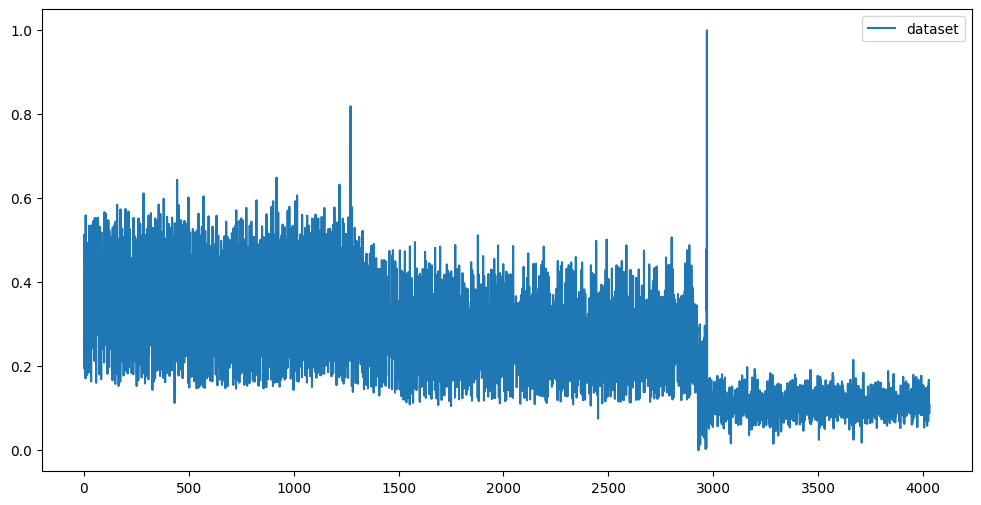

anomaly_iden [34.766 34.86  34.954 35.174 35.254 35.278 35.31  35.376 35.596 35.61
 35.774 35.93  35.938 35.974 35.984 36.08  36.254 36.268 36.314 36.4
 36.408 36.456 36.478 36.496 36.526 36.534 36.568 36.572 36.582 36.596
 36.598 36.616 36.62  36.644 36.666 36.67  36.678 36.712 36.714 36.744
 36.756 36.76  36.784 36.792 36.806 36.808 36.81  36.818 36.824 36.826
 36.83  36.832 36.836 36.842 36.856 36.858 36.864 36.876 36.878 36.882
 36.902 36.908 36.91  36.924 36.926 36.93  36.938 36.944 36.954 36.958
 36.972 36.996 37.004 37.016 37.018 37.036 37.042 37.046 37.056 37.066
 37.068 37.076 37.084 37.09  37.112 37.142 37.15  37.16  37.182 37.19
 37.192 37.206 37.214 37.216 37.23  37.24  37.248 37.252 37.254 37.256
 37.276 37.278 37.29  37.292 37.3   37.308 37.324 37.336 37.348 37.354
 37.37  37.376 37.378 37.394 37.41  37.412 37.414 37.418 37.42  37.434
 37.438 37.44  37.442 37.464 37.472 37.474 37.484 37.488 37.49  37.494
 37.498 37.504 37.508 37.512 37.532 37.536 37.554 37.558 37.562 37.5

In [155]:

'''prediction_array_q10 = []
prediction_array_q90 = []'''
anomalies_array=[]

for h in range(len(anomalies)):
    internal = anomalies[h]
    internal_array = []
    anomalies_array.append(internal)
anomalies_array = scaler.inverse_transform(anomalies_array)
print('anomaly_iden', anomalies_array)
print('anomaly_iden size', len(anomalies_array))
plt.figure(figsize=(12, 6))
#plt.plot(ts, label="passengers")
plt.plot(dataset, label="dataset")
#plt.plot(anomalies_array, label="difference")
#plt.plot(newdata['ewa'], label="ewa")
plt.legend(loc='best')

plt.show()

anomaly_res = ar
anomalies = numpy.unique(anomalies_array)
print('anomaly_iden', anomalies)
print('anomaly_iden size', len(anomalies))
print('ani', anomaly_res)

anomalies_to_int = []

for i in anomalies:
    anomalies_to_int.append(int(i))


truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
print("TP:")
tp = len(truep)
print(tp)
print("FP:")
fp = (len(anomalies) - len(truep))
print(fp)
print("FN:")
fn = len(anomaly_res) - len(truep)
print(fn)
# print("TN:")
# print(1670-tp-fp-fn)
#1670 - datapoints in yahoo8
precision = tp/(tp+fp)
recall = tp/(tp+fn)
print("Precision:")
print(precision)
print("Recall:")
print(recall)

In [156]:

anomaly_res = [62,68]
anomalies = numpy.unique(anomalies_array)
print('anomaly_iden', anomalies)
print('anomaly_iden size', len(anomalies))
print('ani', anomaly_res)

anomalies_to_int = []

for i in anomalies:
    anomalies_to_int.append(int(i))


truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
print("TP:")
tp = len(truep)
print(tp)
print("FP:")
fp = (len(anomalies) - len(truep))
print(fp)
print("FN:")
fn = len(anomaly_res) - len(truep)
print(fn)
# print("TN:")
# print(1670-tp-fp-fn)
#1670 - datapoints in yahoo8
precision = tp/(tp+fp)
recall = tp/(tp+fn)
print("Precision:")
print(precision)
print("Recall:")
print(recall)

anomaly_iden [34.766 34.86  34.954 35.174 35.254 35.278 35.31  35.376 35.596 35.61
 35.774 35.93  35.938 35.974 35.984 36.08  36.254 36.268 36.314 36.4
 36.408 36.456 36.478 36.496 36.526 36.534 36.568 36.572 36.582 36.596
 36.598 36.616 36.62  36.644 36.666 36.67  36.678 36.712 36.714 36.744
 36.756 36.76  36.784 36.792 36.806 36.808 36.81  36.818 36.824 36.826
 36.83  36.832 36.836 36.842 36.856 36.858 36.864 36.876 36.878 36.882
 36.902 36.908 36.91  36.924 36.926 36.93  36.938 36.944 36.954 36.958
 36.972 36.996 37.004 37.016 37.018 37.036 37.042 37.046 37.056 37.066
 37.068 37.076 37.084 37.09  37.112 37.142 37.15  37.16  37.182 37.19
 37.192 37.206 37.214 37.216 37.23  37.24  37.248 37.252 37.254 37.256
 37.276 37.278 37.29  37.292 37.3   37.308 37.324 37.336 37.348 37.354
 37.37  37.376 37.378 37.394 37.41  37.412 37.414 37.418 37.42  37.434
 37.438 37.44  37.442 37.464 37.472 37.474 37.484 37.488 37.49  37.494
 37.498 37.504 37.508 37.512 37.532 37.536 37.554 37.558 37.562 37.5

# -----------------------------------

In [157]:
# print(anomalies)
# x = []

# for i in anomalies:
#     x.append(int(i))

# print(x)
# anomaly_res = [15.,11.]
# print(anomaly_res)

# truep = (numpy.intersect1d(numpy.array(x), numpy.array(anomaly_res)))
# print(truep)
# print(type(anomalies))

In [158]:
# x = [15,11]
# y = [15.,11.]
# x = numpy.array(x)
# y = numpy.array(y)
# truep = (numpy.intersect1d((x), numpy.array(y)))
# print(truep)

In [159]:
# accuracy = (tp + (1670 - tp - fp - fn)) / 1670
# print("Accuracy:")
# print(accuracy)


# ----------------------------
## ----------------------------

                timestamp   value
1271  2014-02-19 00:22:00  62.056
2970  2014-02-24 21:57:00  68.092

timestamp    2014-02-19 00:22:00
value                     62.056
label                          0
Name: 1271, dtype: object

timestamp    2014-02-19 00:22:00
value                     62.056
label                          1
Name: 1271, dtype: object
timestamp    2014-02-24 21:57:00
value                     68.092
label                          1
Name: 2970, dtype: object


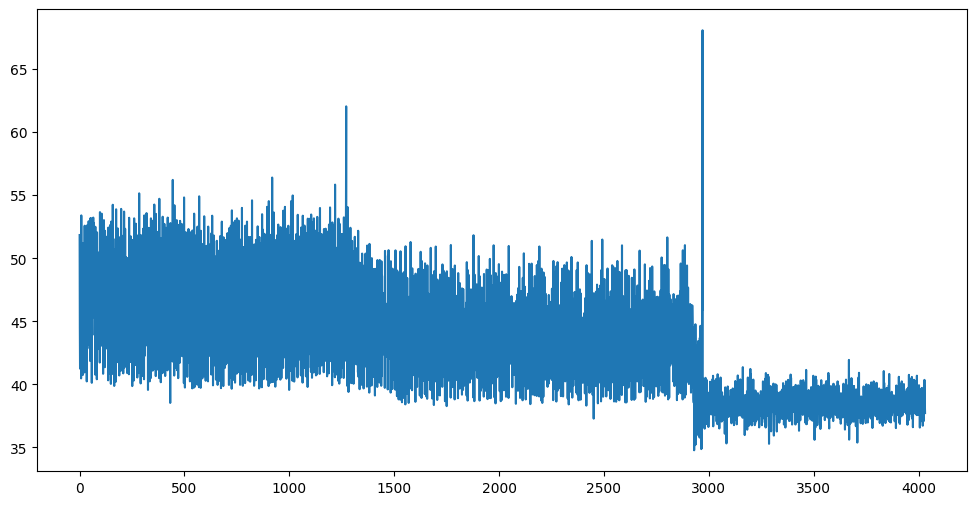

In [160]:
dataframe = read_csv('D:/Q-TV-RNN-Architecture/Q-TV-RNN/archive/realAWSCloudwatch/realAWSCloudwatch/ec2_cpu_utilization_5f5533.csv',  engine='python')
dataframe = dataframe.sort_values(by='timestamp')
dataframe["value"]
plt.figure(figsize=(12, 6))
plt.plot(dataframe['value'])
print(dataframe[dataframe['value'] > 60])

dataframe2 = dataframe
dataframe2['label'] = 0
print()
print(dataframe2.iloc[1271])

dataframe2.loc[1271,'label'] = 1
dataframe2.loc[2970,'label'] = 1

print()
print(dataframe2.iloc[1271])

print(dataframe2.iloc[2970])


ADF test statistic: -0.7335076896084329
p-value: 0.8378783641046514
Critical thresholds:
	1%: -3.431984648591583
	5%: -2.862262298327622
	10%: -2.5671544870656278
	1%: -3.432
	5%: -2.862
	10%: -2.567
critical -3.431984648591583
non stationary
dataset [[51.846]
 [44.508]
 [41.244]
 ...
 [37.912]
 [38.458]
 [37.718]]
ADF test statistic: -0.7335075155036972
p-value: 0.8378784112012503
Critical thresholds:
	1%: -3.431984648591583
	5%: -2.862262298327622
	10%: -2.5671544870656278
	1%: -3.432
	5%: -2.862
	10%: -2.567
critical -3.431984648591583
non stationary
[[0.3461861  0.3652103  0.34555596]
 [0.34735632 0.36274976 0.3486467 ]
 [0.34735632 0.36274976 0.34555596]
 ...
 [0.25376576 0.26246768 0.2620176 ]
 [0.25376576 0.26246768 0.26483822]
 [0.25376576 0.26246768 0.2620176 ]]
alpha 1.8472232
[[[0.3461861 ]
  [0.3652103 ]
  [0.34555596]]

 [[0.34735632]
  [0.36274976]
  [0.3486467 ]]

 [[0.34735632]
  [0.36274976]
  [0.34555596]]

 ...

 [[0.25376576]
  [0.26246768]
  [0.2620176 ]]

 [[0.253

c:\Users\ASUS\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


beta 1.5 input Tensor("sequential_25_1/dense_25_1/Add:0", shape=(1, 1), dtype=float32)
beta 1.5 input Tensor("sequential_25_1/swish_50_1/mul:0", shape=(1, 1), dtype=float32)
2671/2671 - 8s - 3ms/step - loss: 2.8127e-04
Epoch 2/50
2671/2671 - 7s - 2ms/step - loss: 9.6515e-06
Epoch 3/50
2671/2671 - 3s - 1ms/step - loss: 1.0961e-05
Epoch 4/50
2671/2671 - 3s - 1ms/step - loss: 1.0363e-05
Epoch 5/50
2671/2671 - 4s - 1ms/step - loss: 1.0463e-05
Epoch 6/50
2671/2671 - 3s - 1ms/step - loss: 1.0325e-05
Epoch 7/50
2671/2671 - 5s - 2ms/step - loss: 1.0446e-05
Epoch 8/50
2671/2671 - 6s - 2ms/step - loss: 9.8377e-06
Epoch 9/50
2671/2671 - 7s - 3ms/step - loss: 9.5715e-06
Epoch 10/50
2671/2671 - 5s - 2ms/step - loss: 9.7002e-06
Epoch 11/50
2671/2671 - 6s - 2ms/step - loss: 9.7371e-06
Epoch 12/50
2671/2671 - 5s - 2ms/step - loss: 9.1365e-06
Epoch 13/50
2671/2671 - 3s - 1ms/step - loss: 9.1540e-06
Epoch 14/50
2671/2671 - 3s - 1ms/step - loss: 9.2575e-06
Epoch 15/50
2671/2671 - 3s - 1ms/step - loss: 8.

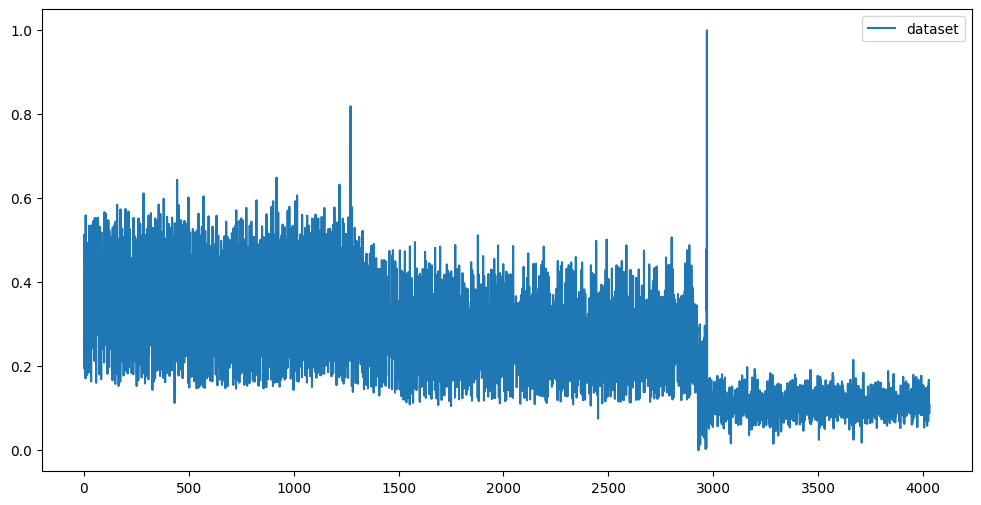

anomaly_iden [34.766 34.86  35.174 35.254 35.278 35.31  35.376 35.596 35.61  35.93
 35.974 36.08  36.254 36.268 36.314 36.4   36.408 36.456 36.496 36.526
 36.534 36.568 36.572 36.582 36.596 36.598 36.62  36.644 36.67  36.678
 36.712 36.714 36.744 36.756 36.76  36.784 36.792 36.806 36.808 36.81
 36.824 36.826 36.832 36.842 36.856 36.858 36.864 36.876 36.882 36.902
 36.908 36.91  36.924 36.926 36.93  36.938 36.944 36.954 36.958 36.972
 36.996 37.004 37.016 37.018 37.036 37.042 37.056 37.066 37.068 37.076
 37.084 37.09  37.112 37.142 37.15  37.16  37.182 37.19  37.192 37.206
 37.214 37.216 37.23  37.24  37.248 37.252 37.254 37.256 37.276 37.278
 37.29  37.292 37.3   37.308 37.324 37.336 37.348 37.354 37.37  37.376
 37.378 37.394 37.412 37.414 37.418 37.42  37.434 37.438 37.44  37.442
 37.464 37.472 37.474 37.484 37.488 37.49  37.494 37.498 37.504 37.508
 37.512 37.532 37.536 37.554 37.558 37.562 37.572 37.574 37.578 37.582
 37.588 37.594 37.606 37.612 37.624 37.63  37.632 37.644 37.652 37

In [164]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from tensorflow.keras import losses
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

period_size = 150
step_size = 50
median_q_threshold=0.5
lower_q_threshold=0.1
upper_q_threshold=0.9
anomaly_res =[15,11]


class Swish(Layer):
    def __init__(self, beta, **kwargs):
        super(Swish, self).__init__(**kwargs)
        self.beta = K.cast_to_floatx(beta)
        print('beta',self.beta)

    def call(self, inputs):
        print('beta', self.beta,'input',inputs)
        return K.softsign(inputs) * self.beta

    def get_config(self):
        config = {'beta': float(self.beta)}
        base_config = super(Swish, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_output_shape(self, input_shape):
        return input_shape


def intersection(lst1, lst2):
    lst3=[]
    for itr in range(len(lst1)):
        if lst1[itr][0] in lst2:
            lst3.append(lst1[itr])
    return lst3



def verify_stationarity(dataset):
    is_stationary=True
    test_results = adfuller(dataset)

    print(f"ADF test statistic: {test_results[0]}")
    print(f"p-value: {test_results[1]}")
    print("Critical thresholds:")

    for key, value in test_results[4].items():
        print(f"\t{key}: {value}")
    itr = 0
    for key, value in test_results[4].items():
       print('\t%s: %.3f' % (key, value))
       if itr==0:
         critical=value
       itr=itr+1

    print('critical',critical)
    if test_results[0] > critical:
         print('non stationary')
         is_stationary=False
    return  is_stationary

def create_dataset(dataset, look_back=1, tw=3):
    dataX, dataY = [], []  # dtaset for mean
    dataUpperX, dataUpperY = [], []  # dataset for std
    dataLowerX, dataLowerY = [], []  # dataset for mean and std for third deep learning
    multi = look_back // tw
    for i in range(len(dataset) - look_back - 1):
        q50X = []
        q90X =  []
        q10X = []
        a = dataset[i + 1:(i + look_back + 1)]
        indices = i + (multi - 1) * tw
        # print('last window', dataset[indices:(i + look_back), 0])
        c = numpy.quantile(a, median_q_threshold)
        u = numpy.quantile(a, upper_q_threshold)
        l = numpy.quantile(a, lower_q_threshold)
        for j in range(0, len(a), tw):
            q50 = numpy.quantile(a[j:j + tw], median_q_threshold)
            q90 = numpy.quantile(a[j:j + tw], upper_q_threshold)
            q10 = numpy.quantile(a[j:j + tw], lower_q_threshold)
            q50X.append(q50)
            q90X.append(q90)
            q10X.append(q10)
        dataX.append(q50X)
        dataY.append(c)
        dataUpperX.append(q90X)
        dataUpperY.append(u)
        dataLowerX.append(q10X)
        dataLowerY.append(l)

    return numpy.array(dataX), numpy.array(dataY), numpy.array(dataUpperX), numpy.array(dataUpperY), numpy.array(dataLowerX), numpy.array(dataLowerY)
def identify_anomaly_quantiles(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        upper_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.9)
        lower_threshold = numpy.quantile(prediction_errors[m:m + period_size],0.1)
        #upper_threshold=avg+2*std1
        #lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]>0 and period_prediction_errors[i]> upper_threshold) or (period_prediction_errors[i]<0 and period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])

    return anomaly_detection

def identify_anomaly(prediction_errors):
    anomaly_detection=[]
    for m in range(0, len(prediction_errors), period_size):
        period_prediction_errors=prediction_errors[m:m + period_size]
        avg = numpy.average(prediction_errors[m:m + period_size])
        std1 = numpy.std(prediction_errors[m:m + period_size])
        upper_threshold=avg+2*std1
        lower_threshold = avg - 2 * std1
        for i in range(len(period_prediction_errors)):
            if (period_prediction_errors[i]> upper_threshold) or ( period_prediction_errors[i]< lower_threshold):
                anomaly_detection.append(period_prediction_errors[i])


    return  anomaly_detection

def identify_alpha(dataset):
    alpha_detection=[]
    alpha=1
    prev_slope=1
    for m in range(0, len(dataset), period_size):
        period_dataset=dataset[m:m + period_size]
        slope=period_dataset[len(period_dataset)-1]-period_dataset[0]
        slope=slope/period_size
        alpha=slope/prev_slope
        alpha_detection.append(alpha)
        prev_slope=slope

    return  numpy.absolute(numpy.mean(alpha_detection))
if __name__ == '__main__':
    # fix random seed for reproducibility
    numpy.random.seed(7)
    # load the dataset
    dataframe = dataframe['value']
    dataset = dataframe.values
    dataset = dataset.reshape(-1,1)
    stationary=verify_stationarity(dataset)
    #dataframe=dataframe.diff(axis = 0, periods = 1)
    #dataset = dataframe.dropna().values
    dataset = dataset.astype('float32')
    # normalize the dataset
    print('dataset', dataset)
    #dataset=dataset.dropna()
    stationary = verify_stationarity(dataset)
    scaler = MinMaxScaler(feature_range=(0, 1))

    dataset = scaler.fit_transform(dataset)

    # split into train and test sets
    train_size = int(len(dataset) * 0.7)
    test_size = len(dataset) - train_size
    train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]
    std=numpy.std(train)
    # reshape into X=t and Y=t+1
    look_back = period_size
    tw = step_size
    multi = look_back // tw
    trainX, trainY, trainXU, trainYU, trainXL, trainYL = create_dataset(train, look_back, tw)
    testX, testY , testXU, testYU, testXL, testYL= create_dataset(test, look_back, tw)
    print(trainX)

    #plt.show()
    alpha=identify_alpha(dataset)
    print('alpha',alpha)
    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
    testX = numpy.reshape(testX, (testX.shape[0], testX.shape[1], 1))

    trainXU = numpy.reshape(trainXU, (trainXU.shape[0], trainXU.shape[1], 1))
    testXU = numpy.reshape(testXU, (testXU.shape[0], testXU.shape[1], 1))

    trainXL = numpy.reshape(trainXL, (trainXL.shape[0], trainXL.shape[1], 1))
    testXL = numpy.reshape(testXL, (testXL.shape[0], testXL.shape[1], 1))
    print(trainX)

    modelq50 = Sequential()
    modelq50.add(LSTM(4, input_shape=(multi, 1)) )
    modelq50.add(Dense(1))
    modelq50.add(Swish(beta=1.5))
    modelq50.add(Activation(Swish(beta=1.5)))
    modelq50.compile(loss=losses.logcosh, optimizer='adam')
    modelq50.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

    modelq10 = Sequential()
    modelq10.add(LSTM(4, input_shape=(multi, 1)))
    modelq10.add(Dense(1))
    modelq10.add(Swish(beta=1.5))
    modelq10.add(Activation(Swish(beta=1.5)))
    modelq10.compile(loss=losses.logcosh, optimizer='adam')
    modelq10.fit(trainXL, trainYL, epochs=50, batch_size=1, verbose=2)

    modelq90 = Sequential()
    modelq90.add(LSTM(4, input_shape=(multi, 1)))
    modelq90.add(Dense(1))
    modelq90.add(Swish(beta=1.5))
    modelq90.add(Activation(Swish(beta=1.5)))
    modelq90.compile(loss=losses.logcosh, optimizer='adam')
    modelq90.fit(trainXU, trainYU, epochs=50, batch_size=1, verbose=2)
    # trainmeanPredict = modelmean.predict(numpy.array(trainX)
    # t).reshape(1,3,1)estmeanPredict = modelmean.predict(numpy.array(testX)
    # tr).reshape(1,3,1)ainstdPredict = modelstd.predict(numpy.array(trainX)
    # t).reshape(1,3,1)eststdPredict = modelstd.predict(numpy.array(testX)
    # pr).reshape(1,3,1)int('trainmeanPredict',trainmeanPredict)
    i = 0
    j = look_back
    actual_quantile_interval = []
    steps = tw
    positive = True
    anomalies=[]
    finalres_q10 = []
    finalres_q90 = []
    dataframe = dataframe2['value']
    dataset = dataframe.values
    dataset = dataset.reshape(-1,1)
    dataset = scaler.fit_transform(dataset)
    ts = dataset
    ts_accumulate=[]
    comparison_dataset=[]
    while j <= len(dataset)-2:
        q50_array = []
        q10_array = []
        q90_array = []


        temp = dataset[i:j]
        actual_quantile_interval.append(
            numpy.absolute(numpy.quantile(dataset[i + 1:j + 1], lower_q_threshold) - numpy.quantile(dataset[i + 1:j + 1], median_q_threshold)))
        print('print here', temp)

        for m in range(0, len(temp), steps):
            q50array = []
            q10array = []
            q90array = []
            q50 = numpy.quantile(temp[m:m + steps], median_q_threshold)
            q50array.append(q50)
            q50_array.append(q50array)

            q90 = numpy.quantile(temp[m:m + steps], upper_q_threshold)
            q90array.append(q90)
            q90_array.append(q90array)

            q10 = numpy.quantile(temp[m:m + steps], lower_q_threshold)
            q10array.append(q10)
            q10_array.append(q10array)

        # print('stdarray1', std_array)
        # std_array = numpy.array(std_array)
        # print('stdarray2', std_array)
        # std_array = numpy.reshape(std_array, (std_array.shape[0],std_array.shape[1], 1))
        # print('stdarray3', std_array)
        # print('avg_array',avg_array)
        # avg_array = numpy.array(avg_array)
        # avg_array = numpy.reshape(avg_array, (avg_array.shape[0],1, 1))
        final_q50_array = []
        final_q50_array.append(q50_array)
        print('final_q10_array', final_q50_array)
        final_q10_array = []
        final_q10_array.append(q10_array)

        final_q90_array = []
        final_q90_array.append(q90_array)
        q50_predict = modelq50.predict(numpy.array(final_q50_array).reshape(1,3,1))
        print('q50_predict', q50_predict)
        q10_predict = modelq10.predict(numpy.array(final_q10_array).reshape(1,3,1))
        q90_predict = modelq90.predict(numpy.array(final_q90_array).reshape(1,3,1))

        if j+1 < len(dataset) :
            iqr=q90_predict-q10_predict
            ucl=q50_predict+.95*iqr
            lcl=q50_predict-.95*iqr
            diff=q50_predict-dataset[j+1]
            if dataset[j+1]>ucl or dataset[j+1]<lcl:
                anomalies.append(dataset[j+1])
            #print('data',dataset[j+1],'diff',diff)

            #comparison_dataset.append(dataset[j+1])
            #dataset=numpy.delete(dataset,j+1)
            #print('length',len(dataset))
        #finalres_q10.append(q10_predict)
        #finalres_q90.append(q90_predict)

        j = j + 1
        i = i + 1

    # print('finalres',finalres)
    '''prediction_array_q10 = []
    prediction_array_q90 = []'''
    anomalies_array=[]

    for h in range(len(anomalies)):
        internal = anomalies[h]
        internal_array = []
        #internal_array.append(internal[0])
        anomalies_array.append(internal)
    anomalies_array = scaler.inverse_transform(anomalies_array)
    #comparison_dataset=scaler.inverse_transform(comparison_dataset)
    #print(anomalies_array)
    print('anomaly_iden', anomalies_array)
    print('anomaly_iden size', len(anomalies_array))
    '''for itr in range(len(anomalies_array)):
        print('data',comparison_dataset[itr],'diff',anomalies_array[itr])
    print('anomaly length',len(anomalies_array))'''
    '''ts_accumulate_another=[]
    for h in range(len(finalres_q10)):
        internal = finalres_q10[h]
        internal_q90 = finalres_q90[h]
        prediction_array_q10.append(internal[0])
        prediction_array_q90.append(internal_q90[0])
    for g in range(len(ts_accumulate)):
        internal=[]
        internal.append(ts_accumulate[g])
        #internal_q90 = finalres_q90[h]
        ts_accumulate_another.append(internal)
    finalres_q10 = scaler.inverse_transform(prediction_array_q10)
    finalres_q90 = scaler.inverse_transform(prediction_array_q90)
    #print('finalres', finalres_q10)'''
    '''trunc_finalres = []
    for g in range(len(finalres)):
        trunc_finalres.append(finalres[g])'''
    '''ts = ts[look_back:]
    ts = scaler.inverse_transform(ts)
    ts_accumulate=scaler.inverse_transform(ts_accumulate_another)
    print('lenght', len(ts_accumulate), 'actual_quantile_interval', len(finalres_q10))'''
    '''ts_array = []
    for g in range(len(ts)):
        ts_array.append(ts[g])'''
    '''finalres_q10_array=[]
    finalres_q90_array=[]
    for g in range(len(finalres_q10)-1):
        finalres_q10_array.append(finalres_q10[g])
        finalres_q90_array.append(finalres_q90[g])
    prediction_errors = []'''
   # for y in range(len(finalres_q10_array)):
    #    print('ts_accumulate',ts_accumulate[y], 'finalres_q10_array', finalres_q10_array[y], 'finalres_q90_array', finalres_q90_array[y])
        #prediction_errors.append(numpy.absolute(actual_quantile_interval[y] - trunc_finalres[y]))
    # testScore = math.sqrt(mean_squared_error(ts, trunc_finalres))
    # print('Test Score: %.2f RMSE' % (testScore))
    '''anomalies = identify_anomaly(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print(intersection(anomalies, anomaly_res))'''
    plt.figure(figsize=(12, 6))
    #plt.plot(ts, label="passengers")
    plt.plot(dataset, label="dataset")
    #plt.plot(anomalies_array, label="difference")
    #plt.plot(newdata['ewa'], label="ewa")
    plt.legend(loc='best')

    plt.show()


    anomaly_res = ar
    anomalies = numpy.unique(anomalies_array)
    print('anomaly_iden', anomalies)
    print('anomaly_iden size', len(anomalies))
    print('ani', anomaly_res)

    anomalies_to_int = []

    for i in anomalies:
        anomalies_to_int.append(int(i))

    truep = (numpy.intersect1d(numpy.array(anomalies_to_int), numpy.array(anomaly_res)))
    print("TP:")
    tp = len(truep)
    print(tp)
    print("FP:")
    fp = (len(anomalies) - len(truep))
    print(fp)
    print("FN:")
    fn = len(anomaly_res) - len(truep)
    print(fn)
    print("TN:")
    print(1670-tp-fp-fn)
    #1670 - datapoints in yahoo8
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    print("Precision:")
    print(precision)
    print("Recall:")
    print(recall)